## Model training

### Set up/check environment

In [1]:
# check python environment
!conda info
# active environment should be WM_ML


     active environment : WM_ML
    active env location : /opt/anaconda3/envs/WM_ML
            shell level : 1
       user config file : /Users/jilliancheck/.condarc
 populated config files : /Users/jilliancheck/.condarc
          conda version : 24.11.3
    conda-build version : 24.5.1
         python version : 3.12.4.final.0
                 solver : libmamba (default)
       virtual packages : __archspec=1=m1
                          __conda=24.11.3=0
                          __osx=15.3.1=0
                          __unix=0=0
       base environment : /opt/anaconda3  (writable)
      conda av data dir : /opt/anaconda3/etc/conda
  conda av metadata url : None
           channel URLs : https://repo.anaconda.com/pkgs/main/osx-arm64
                          https://repo.anaconda.com/pkgs/main/noarch
                          https://repo.anaconda.com/pkgs/r/osx-arm64
                          https://repo.anaconda.com/pkgs/r/noarch
          package cache : /opt/anaconda3/pkgs
   

In [2]:
import numpy as np
from numpy import mean, round
import pandas as pd
import pydot
import graphviz
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import roc_auc_score

# set the number of maximum displayed rows for printed dataframes to 1000
pd.set_option('display.max_rows', 15000)

### CSV load in

In [3]:
# For weather data!!!!
x_train = pd.read_csv(r'/Users/jilliancheck/OneDrive - Michigan State University/Documents/Work/White mold/Modeling/jupyter notebooks/!Finalizing - 2024/Stratified data sets/x_train_RTMA_corr.csv')
y_train = pd.read_csv(r'/Users/jilliancheck/OneDrive - Michigan State University/Documents/Work/White mold/Modeling/jupyter notebooks/!Finalizing - 2024/Stratified data sets/y_train_RTMA_corr.csv')
x_test = pd.read_csv(r'/Users/jilliancheck/OneDrive - Michigan State University/Documents/Work/White mold/Modeling/jupyter notebooks/!Finalizing - 2024/Stratified data sets/x_test_RTMA_corr.csv')
y_test = pd.read_csv(r'/Users/jilliancheck/OneDrive - Michigan State University/Documents/Work/White mold/Modeling/jupyter notebooks/!Finalizing - 2024/Stratified data sets/y_test_RTMA_corr.csv')

# Check data sets and their lengths
print('x training data, n =', len(x_train))
print('y training data, n =', len(y_train))
print('x test data, n =', len(x_test))
print('y test data, n =', len(y_test))
#display(x_train)
#display(y_train)
#display(x_test)
#display(y_test)

x training data, n = 117
y training data, n = 117
x test data, n = 30
y test data, n = 30


In [4]:
# Define cross validation scheme
cv=StratifiedShuffleSplit(n_splits=5, test_size=0.20, random_state=42)

## Alg 1: Binomial Logistic Regression
### Using with stepwise selection comparison and k_features optimization with mlxtend, and not using CV grid search
* Resource: https://rasbt.github.io/mlxtend/#examples

In [5]:
from sklearn import linear_model
from mlxtend.feature_selection import SequentialFeatureSelector
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV, cross_val_score, ShuffleSplit
from sklearn.metrics import accuracy_score, confusion_matrix

### Stepwise selection method and feature selection

In [6]:
# Comparing selection methods (forwards vs backwards, floating vs not) and optimizing the number of features included

lr = linear_model.LogisticRegression(random_state=42)

# Sequential Forward Selection
sfs = SequentialFeatureSelector(lr,
          k_features=(1,6), 
          forward=True, 
          floating=False, 
          scoring='accuracy',
          cv=cv,
          n_jobs=-1)
sfs = sfs.fit(x_train, y_train.values.ravel())

print('\nSequential Forward Selection:')
print(len(sfs.k_feature_idx_), 'features;', sfs.k_feature_names_)
print('CV Score:')
print(sfs.k_score_)
###################################################

# Sequential Backward Selection
sbs = SequentialFeatureSelector(lr,
          k_features=(1,6), 
          forward=False, 
          floating=False, 
          scoring='accuracy',
          cv=cv,
          n_jobs=-1)
sbs = sbs.fit(x_train, y_train.values.ravel())

print('\nSequential Backward Selection:')
print(len(sbs.k_feature_idx_), 'features;', sbs.k_feature_names_)
print('CV Score:')
print(sbs.k_score_)

###################################################

# Sequential Forward Floating Selection
sffs = SequentialFeatureSelector(lr,
           k_features=(1,6), 
           forward=True, 
           floating=True, 
           scoring='accuracy',
           cv=cv,
           n_jobs=-1)
sffs = sffs.fit(x_train, y_train.values.ravel())

print('\nSequential Forward Floating Selection:')
print(len(sffs.k_feature_idx_), 'features;', sffs.k_feature_names_)
print('CV Score:')
print(sffs.k_score_)

###################################################

# Sequential Backward Floating Selection
sbfs = SequentialFeatureSelector(lr,
           k_features=(1,6), 
           forward=False, 
           floating=True, 
           scoring='accuracy',
           cv=cv,
           n_jobs=-1)
sbfs = sbfs.fit(x_train, y_train.values.ravel())

print('\nSequential Backward Floating Selection:')
print(len(sbfs.k_feature_idx_), 'features;', sbfs.k_feature_names_)
print('CV Score:')
print(sbfs.k_score_)

/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selecti


Sequential Forward Selection:
5 features; ('soil type', 'MA_MaxRH86', 'MA_SumATD', 'MA_SumRF_IBM', 'MA_MaxWS')
CV Score:
0.7166666666666667


/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selecti


Sequential Backward Selection:
5 features; ('soil type', 'MA_MaxRH86', 'MA_SumATD', 'MA_SumRF_IBM', 'MA_MaxWS')
CV Score:
0.7166666666666667

Sequential Forward Floating Selection:
5 features; ('soil type', 'MA_MaxRH86', 'MA_SumATD', 'MA_SumRF_IBM', 'MA_MaxWS')
CV Score:
0.7166666666666667

Sequential Backward Floating Selection:
5 features; ('soil type', 'MA_MaxRH86', 'MA_SumATD', 'MA_SumRF_IBM', 'MA_MaxWS')
CV Score:
0.7166666666666667


/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selecti

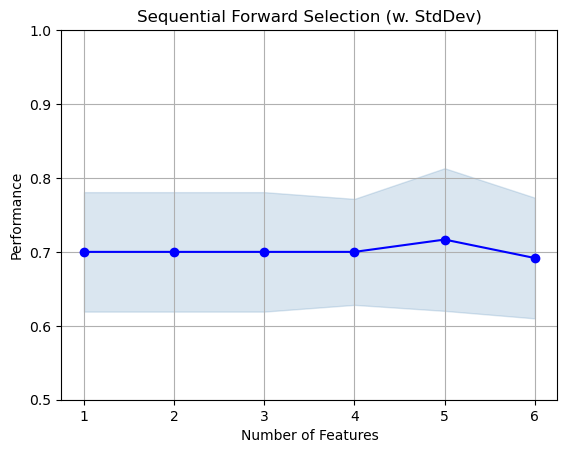

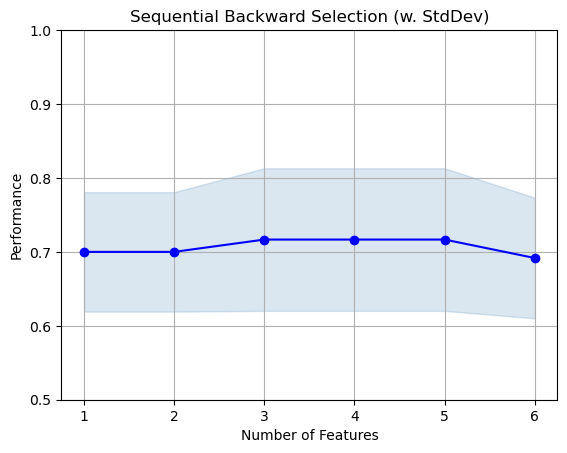

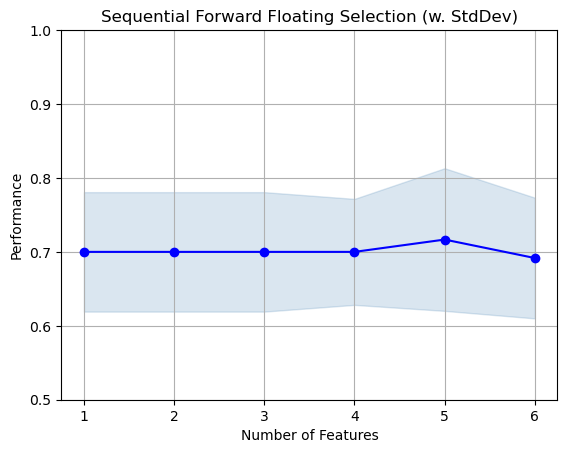

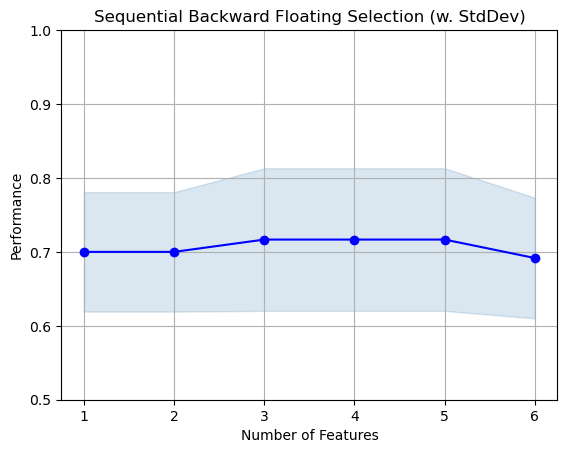

In [7]:
# Plot results 

fig_sfs = plot_sfs(sfs.get_metric_dict(), kind='std_dev')

plt.ylim([0.5, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()

fig_sbs = plot_sfs(sbs.get_metric_dict(), kind='std_dev')

plt.ylim([0.5, 1])
plt.title('Sequential Backward Selection (w. StdDev)')
plt.grid()
plt.show()

fig_sffs = plot_sfs(sffs.get_metric_dict(), kind='std_dev')

plt.ylim([0.5, 1])
plt.title('Sequential Forward Floating Selection (w. StdDev)')
plt.grid()
plt.show()

fig_sbfs = plot_sfs(sbfs.get_metric_dict(), kind='std_dev')
plt.ylim([0.5, 1])
plt.title('Sequential Backward Floating Selection (w. StdDev)')
plt.grid()
plt.show()

In [8]:
# Create a dataframe with only the selected features

selected_columns = list(map(str,sbs.k_feature_names_))
selected_columns = selected_columns[:3] # only keeping the first three because there is no tolerance metric in the selection function, so
    # the max number of columns are retained despite no increase in accuracy
x_train_selected = x_train[selected_columns]
x_test_selected = x_test[selected_columns]

### Hyper parameter grid search

In [9]:
# define parent construction
lr = linear_model.LogisticRegression(random_state=42)

# algorithm to use in optimization
solver = ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga', 'newton-cholesky']
# regulation strength: how much to trust that the training data is representative of population data, model generalization, 
    # overfitting protection
penalty = ['l1', 'l2', 'elasticnet']
# NOTE: not all solvers and penalties are compatable, so expect errors outputted during grid search
# penalty strength
C = np.logspace(0, 5, 6)
   
# define parameter dictionary
param_dict = {
    'solver': solver,                   
    'penalty': penalty, 
    'C': C
}

# all parameters included!

In [10]:
# execute grid search
grid = GridSearchCV(estimator = lr,
                   param_grid = param_dict, # mapping parameter dictionary defined earlier
                    cv = cv,
                    verbose = 3 # option 3 outputs scores for each test
                   )
grid.fit(x_train_selected, y_train.values.ravel())

Fitting 5 folds for each of 108 candidates, totalling 540 fits
[CV 1/5] END .C=1.0, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/5] END .C=1.0, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 3/5] END .C=1.0, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 4/5] END .C=1.0, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 5/5] END .C=1.0, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 1/5] END .....C=1.0, penalty=l1, solver=lbfgs;, score=nan total time=   0.0s
[CV 2/5] END .....C=1.0, penalty=l1, solver=lbfgs;, score=nan total time=   0.0s
[CV 3/5] END .....C=1.0, penalty=l1, solver=lbfgs;, score=nan total time=   0.0s
[CV 4/5] END .....C=1.0, penalty=l1, solver=lbfgs;, score=nan total time=   0.0s
[CV 5/5] END .....C=1.0, penalty=l1, solver=lbfgs;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, penalty=l1, solver=liblinear;, score=0.583 total time=   0.0s
[CV 2/5] END C=1.0, penalty=l1, solver=liblin

/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-pack

[CV 4/5] END C=100.0, penalty=l2, solver=newton-cg;, score=0.750 total time=   0.0s
[CV 5/5] END C=100.0, penalty=l2, solver=newton-cg;, score=0.792 total time=   0.0s
[CV 1/5] END .C=100.0, penalty=l2, solver=lbfgs;, score=0.625 total time=   0.0s
[CV 2/5] END .C=100.0, penalty=l2, solver=lbfgs;, score=0.625 total time=   0.0s
[CV 3/5] END .C=100.0, penalty=l2, solver=lbfgs;, score=0.708 total time=   0.0s
[CV 4/5] END .C=100.0, penalty=l2, solver=lbfgs;, score=0.750 total time=   0.0s
[CV 5/5] END .C=100.0, penalty=l2, solver=lbfgs;, score=0.708 total time=   0.0s
[CV 1/5] END C=100.0, penalty=l2, solver=liblinear;, score=0.625 total time=   0.0s
[CV 2/5] END C=100.0, penalty=l2, solver=liblinear;, score=0.625 total time=   0.0s
[CV 3/5] END C=100.0, penalty=l2, solver=liblinear;, score=0.708 total time=   0.0s
[CV 4/5] END C=100.0, penalty=l2, solver=liblinear;, score=0.792 total time=   0.0s
[CV 5/5] END C=100.0, penalty=l2, solver=liblinear;, score=0.792 total time=   0.0s
[CV 1/5

/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/envs/WM_ML/lib/python3.12/site-pack

[CV 3/5] END C=100000.0, penalty=l1, solver=liblinear;, score=0.750 total time=   0.0s
[CV 4/5] END C=100000.0, penalty=l1, solver=liblinear;, score=0.708 total time=   0.0s
[CV 5/5] END C=100000.0, penalty=l1, solver=liblinear;, score=0.708 total time=   0.0s
[CV 1/5] END ..C=100000.0, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 2/5] END ..C=100000.0, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 3/5] END ..C=100000.0, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 4/5] END ..C=100000.0, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 5/5] END ..C=100000.0, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 1/5] END C=100000.0, penalty=l1, solver=saga;, score=0.625 total time=   0.0s
[CV 2/5] END C=100000.0, penalty=l1, solver=saga;, score=0.625 total time=   0.0s
[CV 3/5] END C=100000.0, penalty=l1, solver=saga;, score=0.667 total time=   0.0s
[CV 4/5] END C=100000.0, penalty=l1, solver=saga;, score=0.792 total time=   0.0s
[CV 5/

/opt/anaconda3/envs/WM_ML/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1051: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.7               nan 0.70833333        nan
 0.7        0.7        0.7        0.7        0.7        0.7
        nan        nan        nan        nan        nan        nan
        nan        nan 0.69166667        nan 0.7               nan
 0.69166667 0.7        0.74166667 0.7        0.70833333 0.69166667
        nan        nan        nan        nan        nan        nan
        nan        nan 0.68333333        nan 0.7               nan
 0.7        0.68333333 0.70833333 0.7        0.7        0.68333333
        nan        nan        nan        nan        nan        nan
        nan        nan 0.68333333        nan 0.7               nan
 0.68333333 0.68333333 0.68333333 0.69166667 0.7        0.68333333
        nan        nan        nan        nan        nan        nan
        nan        nan 0.68333333        nan 0.

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=42, test_size=0.2,
            train_size=None),
             estimator=LogisticRegression(random_state=42),
             param_grid={'C': array([1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05]),
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga', 'newton-cholesky']},
             verbose=3)

In [11]:
# organize grid search results for further exploration
lr_grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["Accuracy"])],axis=1).sort_values('Accuracy', ascending = False)
display(lr_grid_results) 

,C,penalty,solver,Accuracy
26,10.0,l2,liblinear,0.741667
4,1.0,l1,saga,0.708333
44,100.0,l2,liblinear,0.708333
28,10.0,l2,saga,0.708333
2,1.0,l1,liblinear,0.700000
8,1.0,l2,liblinear,0.700000
100,100000.0,l2,saga,0.700000
82,10000.0,l2,saga,0.700000
76,10000.0,l1,saga,0.700000
64,1000.0,l2,saga,0.700000


### Hyper parameter and model setting

In [12]:
# indexing best parameters from GridSearchCV
hyper_lr = grid.best_params_

# print best hyperparamaters
print(hyper_lr)

# tune decision tree model using best hyper parameters
lr_tuned = linear_model.LogisticRegression(random_state = 42,
                                           max_iter=10000,
                                           solver = hyper_lr['solver'],
                                           penalty = hyper_lr['penalty'],
                                           C = hyper_lr['C'])

{'C': 10.0, 'penalty': 'l2', 'solver': 'liblinear'}


### Performance estimation for training data

In [13]:
# evaluate the tuned model
lr_tuned_score = cross_val_score(lr_tuned,
                                 x_train_selected,
                                 y_train.values.ravel(),
                                 cv=cv)

# display the tuned model accurary as a percentage
print('Accuracy scores:', np.round(lr_tuned_score, 2))
print('Average accuracy on training data:', lr_tuned_score.mean())

Accuracy scores: [0.62 0.67 0.75 0.79 0.88]
Average accuracy on training data: 0.7416666666666666


### Evaluate model with test data

In [14]:
# Fit a logistic regression model using the selected features
ypred = lr_tuned.fit(x_train_selected, y_train.values.ravel()).predict(x_test_selected)
yprob = lr_tuned.fit(x_train_selected, y_train.values.ravel()).predict_proba(x_test_selected)

# assessing accuracy of tuned model on test data
lr_tuned_score = lr_tuned.score(x_test_selected, y_test.values.ravel())

# assessing sensitivity/specificity/precision of tuned model on test data
cm = confusion_matrix(y_test, ypred)
tp = cm[0, 0]
fp = cm[0, 1]
tn = cm[1, 1]
fn = cm[1, 0]

# assessing auroc of tuned model
auroc = roc_auc_score(y_test, yprob[:,1])

# print results
print('AUROC', np.round(auroc, 2))
print('Tuned model accuracy on testing data:', np.round(mean(lr_tuned_score), 2))
print('Sensitivity', np.round(tp/(tp+fn), 2))
print('Specficity', np.round(tn/(tn+fp), 2))
print('Precision', np.round(tp/(tp+fp), 2))

AUROC 0.69
Tuned model accuracy on testing data: 0.67
Sensitivity 0.64
Specficity 0.68
Precision 0.54


### Print coefficients

In [15]:
list1 = x_train_selected.columns.tolist()
list2 = lr_tuned.coef_.ravel().tolist()

coefs = pd.DataFrame({'feature': list1, 'coefficient': list2})

display(coefs)

,feature,coefficient
0,soil type,-0.678112
1,MA_MaxRH86,5.296000
2,MA_SumATD,2.030267


## Alg 2: Decision Tree

In [16]:
# packages import
import sklearn
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, ShuffleSplit
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn import tree
from numpy import mean

### Hyper parameter grid search

In [17]:
# define parent construction
dt = DecisionTreeClassifier(random_state=42)

# function to  measure the quality of a split. 'gini' = gini impurity, 'log_loss' and 'entropy', both for the Shannon information gain
criterion = ['gini', 'entropy', 'log_loss']
# splitter: strategy used to choose the split at each node
splitter = ['best']
# maximum depth of decision tree
max_depth = range(7,13)
# minimum number of samples required to split an internal node
min_samples_split = range(3,10)
# minimum number of samples required to be a leaf node
min_samples_leaf = range(3,6)
#ccp_alpha = [0.1]
    
# define parameter dictionary
param_dict = {
    'criterion': criterion,
    'splitter': splitter,
    'max_depth':max_depth, 
    'min_samples_split':min_samples_split, 
    'min_samples_leaf':min_samples_leaf,
    #'ccp_alpha':ccp_alpha
}

# parameters not included in GridSearchCV:
    # min_weight_fraction: minimum weighted fraction of the sum total of weights (of all the input samples) required
        # to be a leaf node. Samples have equal weight when sample_weight is not provided.
    # max_features: the number of features to consider when looking for the best split (default = None)
    # max_leaf_nodes: grow a tree with max leaf nodes in best-first fashion. If none, then unlimited number of leaf nodes
    # min_impurity_decrease: a node will be split if this split induces a decrease of the impurity greater than or equal
        # to this value (default = 0.0)
    # class weight: weights associated with class lables. If none, all classes are supposed to have weight one
    # ccp alpha: complexity parameter used for minimal cost-complexity pruning

In [18]:
# execute grid search
grid = GridSearchCV(estimator = dt,
                    param_grid = param_dict, # mapping parameter dictionary defined earlier
                    cv = cv,
                    verbose = 3 # option 3 outputs scores for each test
                   )
grid.fit(x_train, y_train)

Fitting 5 folds for each of 378 candidates, totalling 1890 fits
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.667 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.708 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.667 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.625 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.625 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.667 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.708 total time=   0.0s
[CV 3/5] END criterion=gin

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=42, test_size=0.2,
            train_size=None),
             estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': range(7, 13),
                         'min_samples_leaf': range(3, 6),
                         'min_samples_split': range(3, 10),
                         'splitter': ['best']},
             verbose=3)

In [19]:
# organize grid search results for further exploration
dt_grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["Accuracy"])],axis=1).sort_values('Accuracy', ascending = False)
display(dt_grid_results)

,criterion,max_depth,min_samples_leaf,min_samples_split,splitter,Accuracy
377,log_loss,12,5,9,best,0.716667
335,log_loss,10,5,9,best,0.716667
312,log_loss,9,5,7,best,0.716667
313,log_loss,9,5,8,best,0.716667
314,log_loss,9,5,9,best,0.716667
205,entropy,10,5,5,best,0.716667
206,entropy,10,5,6,best,0.716667
207,entropy,10,5,7,best,0.716667
251,entropy,12,5,9,best,0.716667
250,entropy,12,5,8,best,0.716667


### Hyper parameter and model setting

In [20]:
# indexing best parameters from GridSearchCV
hyper_dt = grid.best_params_

# print best hyperparamaters
print(hyper_dt)

# tune decision tree model using best hyper parameters
dt_tuned = DecisionTreeClassifier(random_state=42,
                                  criterion = hyper_dt['criterion'],
                                  splitter = hyper_dt['splitter'],
                                  max_depth = hyper_dt['max_depth'],
                                  min_samples_leaf= hyper_dt['min_samples_leaf'],
                                 min_samples_split = hyper_dt['min_samples_split']
                                 #ccp_alpha = hyper_dt['ccp_alpha']
                                 )

{'criterion': 'entropy', 'max_depth': 8, 'min_samples_leaf': 5, 'min_samples_split': 3, 'splitter': 'best'}


### Performance estimation for training data

In [21]:
# evaluate the tuned model
dt_tuned_train_result = cross_val_score(dt_tuned,
                                        x_train,
                                        y_train,
                                        cv=cv)

# display the tuned model accurary as a percentage
print('Accuracy scores:', np.round(dt_tuned_train_result, 2))
print('Average accuracy on training data:', dt_tuned_train_result.mean())

Accuracy scores: [0.79 0.62 0.79 0.83 0.54]
Average accuracy on training data: 0.7166666666666666


### Evaluate model with test data

In [22]:
# using tuned model to make y test data preditions using x test data inputs
ypred = dt_tuned.fit(x_train, y_train).predict(x_test)
yprob = dt_tuned.fit(x_train, y_train.values.ravel()).predict_proba(x_test)

# assessing sensitivity/specificity/precision of tuned model on test data
cm = confusion_matrix(y_test, ypred)
tp = cm[0, 0]
fp = cm[0, 1]
tn = cm[1, 1]
fn = cm[1, 0]

# assessing auroc of tuned model
auroc = roc_auc_score(y_test, yprob[:,1])

# print results
print('AUROC', np.round(auroc, 2))
print('Tuned model accuracy on testing data:', np.round((tp+tn)/(tp+tn+fp+fn), 2))
print('Sensitivity', np.round(tp/(tp+fn), 2))
print('Specficity', np.round(tn/(tn+fp), 2))
print('Precision', np.round(tp/(tp+fp), 2))

AUROC 0.75
Tuned model accuracy on testing data: 0.77
Sensitivity 0.69
Specficity 0.86
Precision 0.85


### Tree visualization

In [23]:
feature_names = x_train.columns[0:]
print(feature_names) 

Index(['soil type', 'row_shading', 'MA_MaxRH86', 'MA_SumATD', 'MA_SumRF_IBM',
       'MA_MaxWS'],
      dtype='object')


In [24]:
# flow chart visualization of decision tree 

feature_names = ['Soil\ntype\n', 'Row\nshading', 'Max\nRHD', 'Sum\nATD', 'Sum\nrainfall', 'Max\nWS']
class_names = ['absent', 'present']

dot_data = tree.export_graphviz(dt_tuned,
                                feature_names = feature_names,
                                class_names = class_names,
                                filled = True, rounded = True, impurity = False)

graph = graphviz.Source(dot_data, format = 'png')
graph
graph.render("decision tree - corr - RTMA", format="png")

'decision tree - corr - RTMA.png'

### Extract feature importance

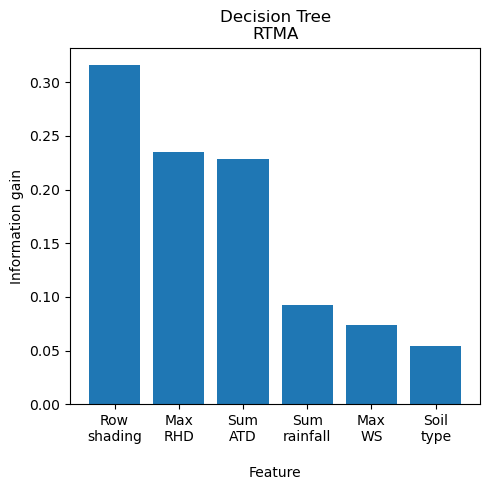

In [25]:
# Get the feature importances from the fitted model
importances = dt_tuned.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# Sort the feature importances in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(5, 5))
plt.bar(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Feature')
plt.ylabel('Information gain')
plt.title('Decision Tree\nRTMA')
plt.tight_layout()
plt.savefig("DT - corr - RTMA - FI.png", dpi = 1200)
plt.show()

In [26]:
display(feature_importances)

,Feature,Importance
1,Row\nshading,0.316313
2,Max\nRHD,0.235057
3,Sum\nATD,0.228382
4,Sum\nRainfall,0.092099
5,Max\nWS,0.074258
0,Soil\ntype\n,0.053891


### Permutation importance

In [65]:
SEseries

,SE,blank
0,0.023333,0
1,0.063246,0
2,0.053852,0
3,0.045216,0
4,0.023333,0
5,0.021082,0


In [69]:
SEseries

,SE,blank
0,0.023333,0
1,0.063246,0
2,0.053852,0
3,0.045216,0
4,0.023333,0
5,0.021082,0


,Feature,Importance,SE
1,Row\nshading,0.133333,0.063246
0,Soil\ntype\n,0.103333,0.023333
3,Sum\nATD,0.086667,0.045216
5,Max\nWS,0.033333,0.021082
4,Sum\nRainfall,0.030000,0.023333
2,Max\nRHD,0.023333,0.053852


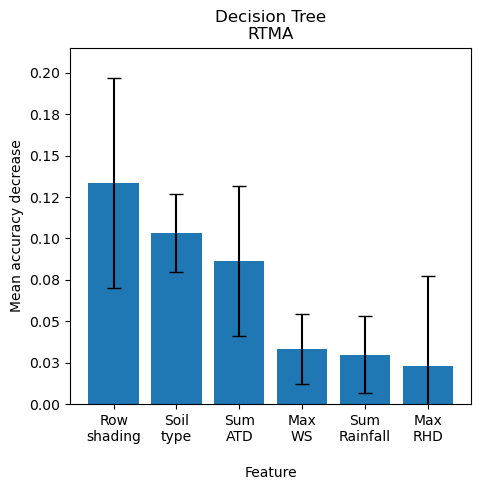

In [88]:
from sklearn.inspection import permutation_importance

#feature_names = x_train.columns[0:]

feature_names = ['Soil\ntype\n', 'Row\nshading', 'Max\nRHD', 'Sum\nATD', 'Sum\nrainfall', 'Max\nWS']

# Compute permutation importance
permutation_imp = permutation_importance(dt_tuned, x_test, y_test, n_repeats=10, random_state=42)

# Create a DataFrame to store the feature importances
permutation_imp = pd.DataFrame({'Feature': feature_names, 
                                'Importance': permutation_imp.importances_mean, 
                                'SE':permutation_imp.importances_std})

# Sort the feature importances in descending order
feature_importances = permutation_imp.sort_values(by='Importance', ascending=False)

display(feature_importances)

# Create boolean array for upper limits only
uplims = [True] * len(permutation_imp['SE'])

# Plot the feature importances
plt.figure(figsize=(5, 5))
plt.bar(feature_importances['Feature'], feature_importances['Importance'], yerr = feature_importances['SE'], capsize=5)
plt.xlabel('Feature')
plt.ylabel('Mean accuracy decrease')
plt.title('Decision Tree\nRTMA')
plt.ylim(0,0.215)
plt.tight_layout()
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.savefig("DT - corr - RTMA - PI_test.png")
plt.show()

## Alg 3: Random Forest

In [17]:
import sklearn
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, ShuffleSplit
from sklearn.metrics import accuracy_score, confusion_matrix

### Hyper parameter grid search

In [18]:
# define parent construction
rf = RandomForestClassifier(random_state=42)

# number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start=20, stop=30, num=10)]
# function to measure quality of split
criterion = ['entropy', 'log_loss', 'gini']
# number of features to consider at every split
#max_features = ['log2']
# maximum number of levels in tree
max_depth = range(7, 11)
# minimum number of samples required to split a node
min_samples_split = range(5,10)
# minimum number of samples required at each leaf node
min_samples_leaf = range(3,5)
# whether bootstrap samples are used when building trees (Default = True)
bootstrap = [True]
ccp_alpha = (0, 0.001, 0.01)

# define parameter dictionary
param_dict = {'n_estimators': n_estimators,
              'criterion': criterion,
               #'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'ccp_alpha': ccp_alpha
               #'bootstrap': bootstrap
             }   

# parameters not included in GridSearchCV:
# min_weight_fraction: The minimum weighted fraction of the sum total of weights (of all the input samples) required to be at a leaf node. Samples have equal weight when sample_weight is not provided.
# max_leaf_nodes: Grow trees with max_leaf_nodes in best-first fashion. Best nodes are defined as relative reduction in impurity. If None then unlimited number of leaf nodes.
# min_impurity_decrease: A node will be split if this split induces a decrease of the impurity greater than or equal to this value.
# oob_score: Whether to use out-of-bag samples to estimate the generalization score. By default, accuracy_score is used.
# class_weight
# ccp_alpha: Complexity parameter used for Minimal Cost-Complexity Pruning
# max_samples: If bootstrap is True, the number of samples to draw from X to train each base estimator.

### Hyper parameter and model setting

In [19]:
grid = GridSearchCV(estimator=rf,
                    param_grid=param_dict,
                    cv=cv,
                    verbose=3)
grid.fit(x_train, y_train.values.ravel())

Fitting 5 folds for each of 3600 candidates, totalling 18000 fits
[CV 1/5] END ccp_alpha=0, criterion=entropy, max_depth=7, min_samples_leaf=3, min_samples_split=5, n_estimators=20;, score=0.750 total time=   0.0s
[CV 2/5] END ccp_alpha=0, criterion=entropy, max_depth=7, min_samples_leaf=3, min_samples_split=5, n_estimators=20;, score=0.625 total time=   0.0s
[CV 3/5] END ccp_alpha=0, criterion=entropy, max_depth=7, min_samples_leaf=3, min_samples_split=5, n_estimators=20;, score=0.750 total time=   0.0s
[CV 4/5] END ccp_alpha=0, criterion=entropy, max_depth=7, min_samples_leaf=3, min_samples_split=5, n_estimators=20;, score=0.750 total time=   0.0s
[CV 5/5] END ccp_alpha=0, criterion=entropy, max_depth=7, min_samples_leaf=3, min_samples_split=5, n_estimators=20;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0, criterion=entropy, max_depth=7, min_samples_leaf=3, min_samples_split=5, n_estimators=21;, score=0.750 total time=   0.0s
[CV 2/5] END ccp_alpha=0, criterion=entropy, m

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=42, test_size=0.2,
            train_size=None),
             estimator=RandomForestClassifier(random_state=42),
             param_grid={'ccp_alpha': (0, 0.001, 0.01),
                         'criterion': ['entropy', 'log_loss', 'gini'],
                         'max_depth': range(7, 11),
                         'min_samples_leaf': range(3, 5),
                         'min_samples_split': range(5, 10),
                         'n_estimators': [20, 21, 22, 23, 24, 25, 26, 27, 28,
                                          30]},
             verbose=3)

[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=25;, score=0.977 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=30;, score=0.909 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=30;, score=0.909 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=30;, score=0.955 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=30;, score=0.920 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=30;,

[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=30;, score=0.909 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=30;, score=0.909 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=30;, score=0.955 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=30;, score=0.920 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=30;, score=0.989 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=35;,

[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=25;, score=0.909 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=25;, score=0.977 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=30;, score=0.920 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=30;, score=0.909 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=30;, score=0.955 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=30;,

[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=25;, score=0.920 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=25;, score=0.966 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=30;, score=0.898 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=30;, score=0.909 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=30;, score=0.920 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=30;,

[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=25;, score=0.920 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=25;, score=0.966 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=30;, score=0.898 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=30;, score=0.909 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=30;, score=0.920 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=30;,

[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=25;, score=0.898 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=25;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=30;, score=0.875 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=30;, score=0.909 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=30;, score=0.920 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=30;,

[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=25;, score=0.886 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=25;, score=0.909 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=25;, score=0.886 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=25;, score=0.977 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=30;, score=0.875 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=30;,

[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=25;, score=0.909 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=25;, score=0.886 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=25;, score=0.977 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=30;, score=0.875 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=30;, score=0.898 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=30;,

[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=25;, score=0.898 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=25;, score=0.943 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=25;, score=0.966 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=30;, score=0.875 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=30;, score=0.898 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=30;,

[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=25;, score=0.977 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=25;, score=0.966 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=25;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=30;, score=0.955 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=30;, score=0.932 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=30;,

[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=25;, score=0.943 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=25;, score=0.977 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=25;, score=0.966 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=25;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=30;, score=0.955 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=30;,

[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=20;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=25;, score=0.955 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=25;, score=0.943 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=25;, score=0.977 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=25;, score=0.977 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=25;,

[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=20;, score=0.966 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=20;, score=0.966 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=20;, score=0.989 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=25;, score=0.943 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=25;, score=0.943 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=25;,

[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=20;, score=0.909 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=20;, score=0.932 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=20;, score=0.966 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=20;, score=0.966 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=20;, score=0.989 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=25;,

[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=40;, score=0.943 total time=   0.1s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=40;, score=1.000 total time=   0.1s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=20;, score=0.898 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=20;, score=0.943 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=20;, score=0.955 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=20;,

[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=40;, score=0.955 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=40;, score=0.943 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=40;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=20;, score=0.920 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=20;, score=0.932 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=20;,

[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=40;, score=0.932 total time=   0.1s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=40;, score=0.955 total time=   0.1s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=40;, score=0.966 total time=   0.1s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=40;, score=0.943 total time=   0.1s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=40;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=20;,

[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=35;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=40;, score=0.932 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=40;, score=0.943 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=40;, score=0.955 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=40;, score=0.977 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=40;,

[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=35;, score=0.989 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=35;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=40;, score=0.932 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=40;, score=0.943 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=40;, score=0.955 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=40;,

[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=35;, score=0.955 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=35;, score=0.989 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=35;, score=0.977 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=35;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=40;, score=0.977 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=40;,

[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=35;, score=0.989 total time=   0.1s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=35;, score=0.955 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=35;, score=0.989 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=35;, score=0.977 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=35;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=40;,

[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=30;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=35;, score=0.989 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=35;, score=0.955 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=35;, score=0.989 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=35;, score=0.977 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=35;,

[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=30;, score=0.977 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=30;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=35;, score=0.977 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=35;, score=0.932 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=35;, score=0.966 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=35;,

[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=30;, score=0.966 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=30;, score=0.977 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=30;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=35;, score=0.932 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=35;, score=0.966 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=35;,

[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=30;, score=0.966 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=30;, score=0.977 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=30;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=35;, score=0.932 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=35;, score=0.966 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=35;,

[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=30;, score=0.966 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=30;, score=0.989 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=30;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=35;, score=0.932 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=35;, score=0.966 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=35;,

[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=30;, score=0.955 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=30;, score=0.989 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=30;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=35;, score=0.932 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=35;, score=0.955 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=35;,

[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=30;, score=0.955 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=30;, score=0.989 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=30;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=35;, score=0.932 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=35;, score=0.955 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=35;,

[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30;, score=0.966 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30;, score=0.989 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30;, score=0.989 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=35;, score=0.955 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=35;,

[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=30;, score=0.989 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=30;, score=0.989 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=30;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=35;, score=0.966 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=35;, score=0.943 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=35;,

[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=30;, score=0.989 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=30;, score=0.989 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=30;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=35;, score=0.966 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=35;, score=0.943 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=35;,

[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=30;, score=0.989 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=30;, score=0.977 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=30;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=35;, score=0.977 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=35;, score=0.955 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=35;,

[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=30;, score=0.943 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=30;, score=0.966 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=30;, score=0.966 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=30;, score=0.989 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=30;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=35;,

[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=30;, score=0.943 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=30;, score=0.966 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=30;, score=0.966 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=30;, score=0.989 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=30;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=35;,

[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=25;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=30;, score=0.943 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=30;, score=0.966 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=30;, score=0.977 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=30;, score=0.989 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=30;,

[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=25;, score=0.977 total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=25;, score=1.000 total time=   0.0s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=30;, score=0.932 total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=30;, score=0.977 total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=30;, score=0.955 total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=30;,

[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=25;, score=0.955 total time=   0.1s
[CV 4/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=25;, score=0.977 total time=   0.1s
[CV 5/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=25;, score=1.000 total time=   0.1s
[CV 1/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=30;, score=0.932 total time=   0.2s
[CV 2/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=30;, score=0.977 total time=   0.1s
[CV 3/5] END bootstrap=False, criterion=log_loss, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=30;,

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=42, test_size=0.2,
            train_size=None),
             estimator=RandomForestClassifier(random_state=42),
             param_grid={'bootstrap': [False],
                         'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': range(5, 10),
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': range(2, 5),
                         'min_samples_split': range(2, 5),
                         'n_estimators': [20, 25, 30, 35, 40]},
             verbose=3)

In [20]:
# organize grid search results for further exploration
rf_grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["Accuracy"])],axis=1).sort_values('Accuracy', ascending = False)
display(rf_grid_results)

,ccp_alpha,criterion,max_depth,min_samples_leaf,min_samples_split,n_estimators,Accuracy
1972,0.001,log_loss,10,4,7,22,0.766667
2882,0.010,log_loss,7,4,8,22,0.766667
2862,0.010,log_loss,7,4,6,22,0.766667
2866,0.010,log_loss,7,4,6,26,0.766667
1682,0.001,log_loss,7,4,8,22,0.766667
2872,0.010,log_loss,7,4,7,22,0.766667
2876,0.010,log_loss,7,4,7,26,0.766667
2466,0.010,entropy,7,4,6,26,0.766667
552,0.000,log_loss,8,4,5,22,0.766667
2886,0.010,log_loss,7,4,8,26,0.766667


In [21]:
# indexing best parameters from GridSearchCV
hyper_rf = grid.best_params_

# print best hyperparamaters
print(hyper_rf)

# tune decision tree model using best hyper parameters
rf_tuned = RandomForestClassifier(random_state=42,
    n_estimators = hyper_rf["n_estimators"],
    min_samples_split = hyper_rf["min_samples_split"],
    min_samples_leaf = hyper_rf["min_samples_leaf"],
    #max_features = hyper_rf["max_features"],
    max_depth = hyper_rf["max_depth"]
    #bootstrap = hyper_rf["bootstrap"]
                                 )

{'ccp_alpha': 0, 'criterion': 'entropy', 'max_depth': 7, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 22}


### Performance estimation for training data

In [22]:
# evaluate the tuned model
rf_tuned_train_result = cross_val_score(rf_tuned,
                                        x_train,
                                        y_train.values.ravel(),
                                        cv=cv)

# display the tuned model accurary as a percentage
print('Accuracy scores:', np.round(rf_tuned_train_result, 2))
print('Average accuracy on training data:', rf_tuned_train_result.mean())

Accuracy scores: [0.71 0.62 0.71 0.79 0.79]
Average accuracy on training data: 0.725


### Evaluate model with test data

In [23]:
# using tuned model to make y test data preditinos using x test data inputs
ypred = rf_tuned.fit(x_train, y_train.values.ravel()).predict(x_test)
yprob = rf_tuned.fit(x_train, y_train.values.ravel()).predict_proba(x_test)

# assessing sensitivity/specificity/precision of tuned model on test data
cm = confusion_matrix(y_test, ypred)
tp = cm[0, 0]
fp = cm[0, 1]
tn = cm[1, 1]
fn = cm[1, 0]

# assessing auroc of tuned model
auroc = roc_auc_score(y_test, yprob[:,1])

# print results
print('AUROC', np.round(auroc, 2))
print('Tuned model accuracy on testing data:', np.round((tp+tn)/(tp+tn+fp+fn), 2))
print('Sensitivity', np.round(tp/(tp+fn), 2))
print('Specficity', np.round(tn/(tn+fp), 2))
print('Precision', np.round(tp/(tp+fp), 2))

AUROC 0.8
Tuned model accuracy on testing data: 0.73
Sensitivity 0.69
Specficity 0.76
Precision 0.69


### Visualize

In [24]:
# Visualizing 20 trees
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(20, 15), dpi=900)

# Flatten the axes array to 1D so you can index it with a single number
axes = axes.flatten()

# Loop to plot the first 20 estimators
for index in range(0,20,1):
    tree.plot_tree(
        rf_tuned.estimators_[index],  # Get the tree from the tuned random forest
        feature_names = x_test.columns, 
        class_names= ['1','0'],
        filled=True,
        ax=axes[index]
    );
    axes[index].set_title(f'Estimator: {index}', fontsize=8)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

fig.savefig("randomforest - corr - RTMA.png")

### Extract feature importance

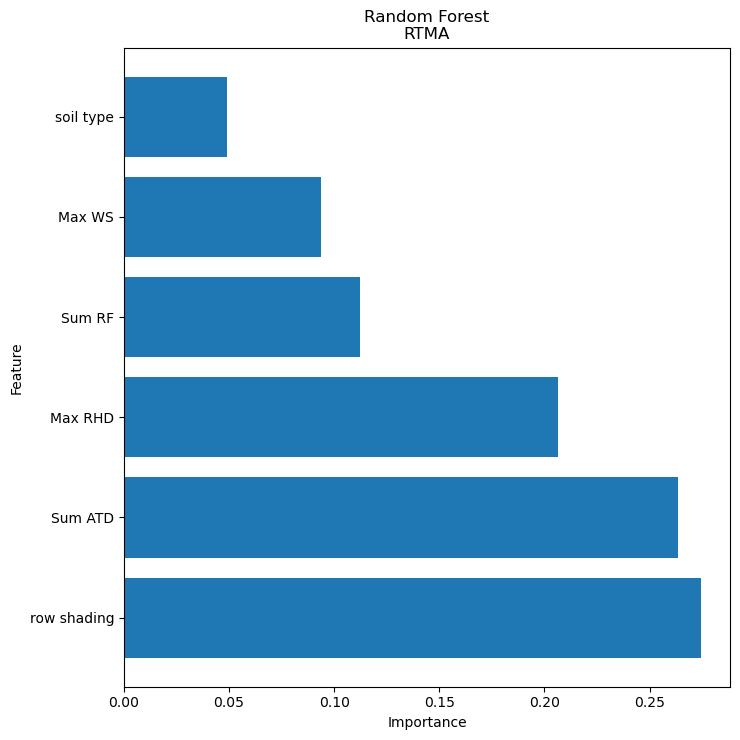

In [25]:
# Get the feature importances from the fitted model
importances = rf_tuned.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# Sort the feature importances in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(7.5, 7.5))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Random Forest\nRTMA')
plt.tight_layout()
plt.savefig("RF - corr - RTMA - FI.png")
plt.show()

### Permutation importance

,Feature,Importance
3,Sum ATD,0.036667
1,row shading,0.033333
4,Sum RF,0.020000
0,soil type,-0.006667
2,Max RHD,-0.016667
5,Max WS,-0.020000


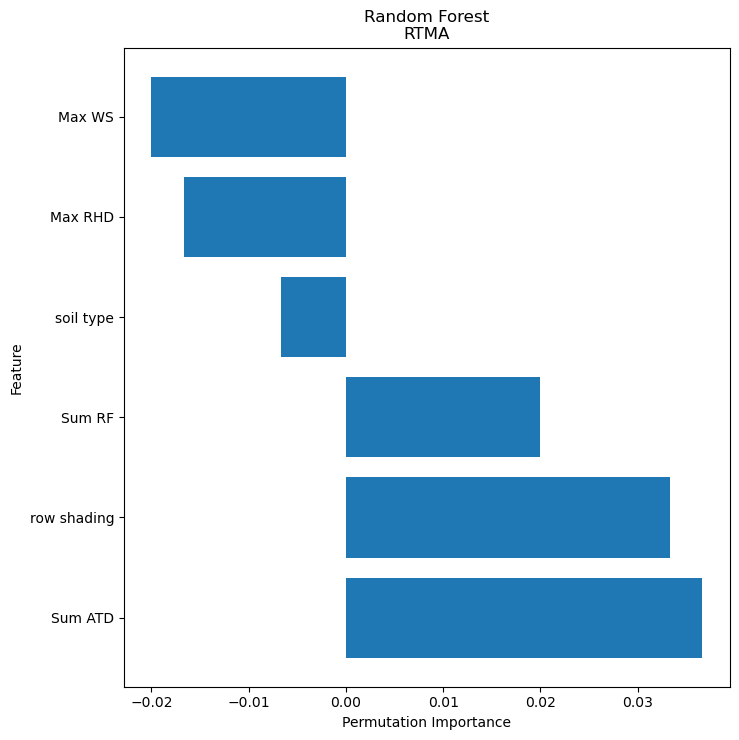

In [42]:
from sklearn.inspection import permutation_importance

#feature_names = x_train.columns[0:]

feature_names = ['soil type', 'row shading', 'Max RHD', 'Sum ATD', 'Sum RF', 'Max WS']

# Compute permutation importance
permutation_imp = permutation_importance(rf_tuned, x_test, y_test, n_repeats=10, random_state=42)

# Create a DataFrame to store the feature importances
permutation_imp = pd.DataFrame({'Feature': feature_names, 'Importance': permutation_imp.importances_mean})

# Sort the feature importances in descending order
feature_importances = permutation_imp.sort_values(by='Importance', ascending=False)

display(feature_importances)

# Plot the feature importances
plt.figure(figsize=(7.5, 7.5))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Permutation Importance')
plt.ylabel('Feature')
plt.title('Random Forest\nRTMA')
plt.tight_layout()
plt.savefig("RF - corr - RTMA - PI_test.png")
plt.show()

## Alg 4: Support Vector Machine

In [31]:
import numpy as np
import pandas as pd
from sklearn.model_selection import GridSearchCV, cross_val_score, ShuffleSplit
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

### Hyperparameter grid search

In [32]:
# define the parent construction
svm = SVC(random_state=42)

# C: regularization penalty
C = [0.1, 1, 10]
# kernel: Specifies the kernel type to be used in the algorithm
kernel = ['linear', 'rbf', 'poly']
# gamma: kernel coefficient
gamma = ['scale', 'auto']
# degree: degree of the polynomial kernel function
degree = [1, 2, 3, 4, 5]

decision_function_shape = ['ovo', 'ovr']

# define parameter dictionary
param_dict = {
    'C': C,
    'kernel': kernel,
    'gamma': gamma,
    'degree': degree,
    'decision_function_shape': decision_function_shape
}

In [33]:
# execute grid search
grid = GridSearchCV(estimator = svm,
                    param_grid = param_dict, # mapping parameter dictionary defined earlier
                    cv = cv, 
                    verbose = 3 # option 3 outputs scores for each test
                   )

grid.fit(x_train, y_train.values.ravel())

Fitting 5 folds for each of 180 candidates, totalling 900 fits
[CV 1/5] END C=0.1, decision_function_shape=ovo, degree=1, gamma=scale, kernel=linear;, score=0.583 total time=   0.0s
[CV 2/5] END C=0.1, decision_function_shape=ovo, degree=1, gamma=scale, kernel=linear;, score=0.583 total time=   0.0s
[CV 3/5] END C=0.1, decision_function_shape=ovo, degree=1, gamma=scale, kernel=linear;, score=0.583 total time=   0.0s
[CV 4/5] END C=0.1, decision_function_shape=ovo, degree=1, gamma=scale, kernel=linear;, score=0.583 total time=   0.0s
[CV 5/5] END C=0.1, decision_function_shape=ovo, degree=1, gamma=scale, kernel=linear;, score=0.583 total time=   0.0s
[CV 1/5] END C=0.1, decision_function_shape=ovo, degree=1, gamma=scale, kernel=rbf;, score=0.583 total time=   0.0s
[CV 2/5] END C=0.1, decision_function_shape=ovo, degree=1, gamma=scale, kernel=rbf;, score=0.667 total time=   0.0s
[CV 3/5] END C=0.1, decision_function_shape=ovo, degree=1, gamma=scale, kernel=rbf;, score=0.708 total time=  

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=42, test_size=0.2,
            train_size=None),
             estimator=SVC(random_state=42),
             param_grid={'C': [0.1, 1, 10],
                         'decision_function_shape': ['ovo', 'ovr'],
                         'degree': [1, 2, 3, 4, 5], 'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'rbf', 'poly']},
             verbose=3)

In [34]:
# organize grid search results for further exploration
svm_grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["Accuracy"])],axis=1).sort_values('Accuracy', ascending = False)
display(svm_grid_results)

,C,decision_function_shape,degree,gamma,kernel,Accuracy
110,1.0,ovr,4,scale,poly,0.758333
164,10.0,ovr,3,scale,poly,0.758333
134,10.0,ovo,3,scale,poly,0.758333
80,1.0,ovo,4,scale,poly,0.758333
26,0.1,ovo,5,scale,poly,0.750000
56,0.1,ovr,5,scale,poly,0.750000
104,1.0,ovr,3,scale,poly,0.733333
74,1.0,ovo,3,scale,poly,0.733333
94,1.0,ovr,1,auto,rbf,0.725000
70,1.0,ovo,2,auto,rbf,0.725000


### Hyperparameter and model setting

In [35]:
# indexing best parameters from GridSearchCV
hyper_params = grid.best_params_

# print best hyperparamaters
print("Best Hyperparameters:", hyper_params)

# tune model using best hyper parameters
svm_tuned = SVC(random_state=42,
                C = hyper_params['C'],
                kernel = hyper_params['kernel'],
                gamma = hyper_params['gamma'],
                degree = hyper_params['degree'],
               probability = True)

Best Hyperparameters: {'C': 1, 'decision_function_shape': 'ovo', 'degree': 4, 'gamma': 'scale', 'kernel': 'poly'}


### Performance estimation for training data

In [36]:
# evaluate the tuned model
svm_tuned_train_result = cross_val_score(svm_tuned,
                                     x_train,
                                     y_train.values.ravel(),
                                     cv=cv)

# display the tuned model accurary as a percentage
print('Accuracy scores:', np.round(svm_tuned_train_result, 2))
print('Average accuracy on training data:', svm_tuned_train_result.mean())

Accuracy scores: [0.62 0.71 0.79 0.79 0.88]
Average accuracy on training data: 0.7583333333333333


### Evaluate model with test data

In [37]:
# using tuned model to make y test data preditinos using x test data inputs
ypred = svm_tuned.fit(x_train, y_train.values.ravel()).predict(x_test)
yprob = svm_tuned.fit(x_train, y_train.values.ravel()).predict_proba(x_test)

# assessing sensitivity/specificity/precision of tuned model on test data
cm = confusion_matrix(y_test, ypred)
tp = cm[0, 0]
fp = cm[0, 1]
tn = cm[1, 1]
fn = cm[1, 0]

# assessing auroc of tuned model
auroc = roc_auc_score(y_test, yprob[:,1])

# print results
print('AUROC', np.round(auroc, 2))
print('Tuned model accuracy on testing data:', np.round((tp+tn)/(tp+tn+fp+fn), 2))
print('Sensitivity', np.round(tp/(tp+fn), 2))
print('Specficity', np.round(tn/(tn+fp), 2))
print('Precision', np.round(tp/(tp+fp), 2))

AUROC 0.81
Tuned model accuracy on testing data: 0.7
Sensitivity 0.62
Specficity 0.79
Precision 0.77


### Visualize

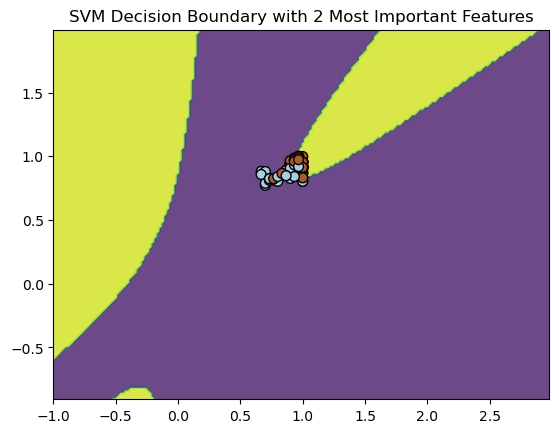

In [38]:
from sklearn.feature_selection import SelectKBest, f_classif

# Select the 2 most important features
selector = SelectKBest(f_classif, k=2)
x_train_selected = selector.fit_transform(x_train, y_train.values.ravel())
x_test_selected = selector.transform(x_test)

# Train the SVM on the selected features
svm = SVC(kernel='poly')
svm.fit(x_train_selected, y_train.values.ravel())

# Define the plot function
def plot_svm(x, y, model):
    h = .02  # Step size in the mesh
    x_min, x_max = x_train.iloc[:, 0].min() - 1, x_train.iloc[:, 0].max() + 1
    y_min, y_max = x_train.iloc[:, 1].min() - 1, x_train.iloc[:, 1].max() + 1

    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z, alpha=0.8)
    plt.scatter(x_train_selected[:, 0], x_train_selected[:, 1], c=y_train.values.ravel(), edgecolors='k', marker='o', s=50, cmap=plt.cm.Paired)
    plt.title("SVM Decision Boundary with 2 Most Important Features")
    plt.show()

# Plot decision boundary
plot_svm(x_train_selected, y_train, svm)

### Permutation importance

,Feature,Importance
3,Sum ATD,0.096667
4,Sum RF,0.043333
2,Max RHD,0.030000
5,Max WS,0.013333
0,soil type,0.006667
1,row shading,0.003333


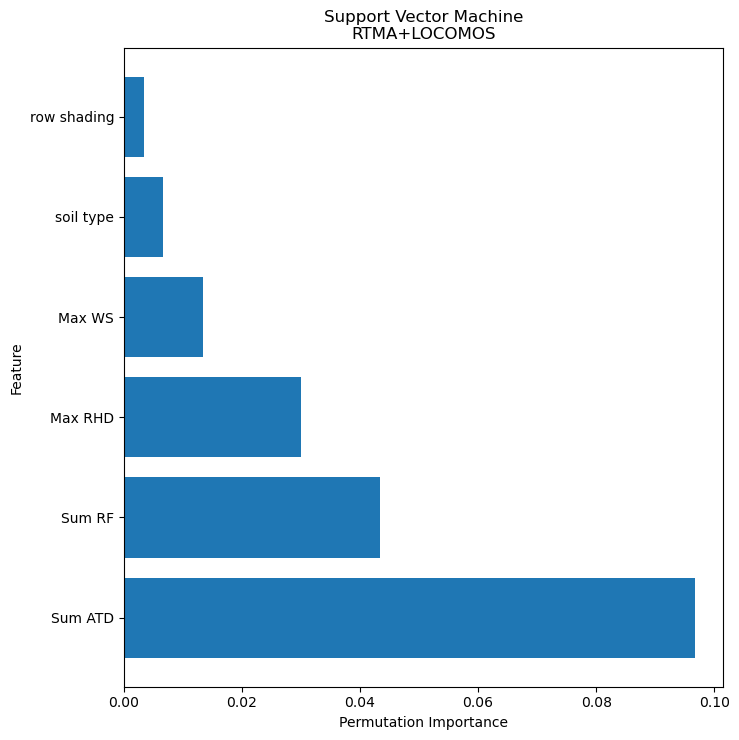

In [41]:
from sklearn.inspection import permutation_importance

#feature_names = x_train.columns[0:]

feature_names = ['soil type', 'row shading', 'Max RHD', 'Sum ATD', 'Sum RF', 'Max WS']

# Compute permutation importance
permutation_imp = permutation_importance(svm_tuned, x_test, y_test, n_repeats=10, random_state=42)

# Create a DataFrame to store the feature importances
permutation_imp = pd.DataFrame({'Feature': feature_names, 'Importance': permutation_imp.importances_mean})

# Sort the feature importances in descending order
feature_importances = permutation_imp.sort_values(by='Importance', ascending=False)

display(feature_importances)

# Plot the feature importances
plt.figure(figsize=(7.5, 7.5))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Permutation Importance')
plt.ylabel('Feature')
plt.title('Support Vector Machine\nRTMA+LOCOMOS')
plt.tight_layout()
plt.savefig("SVM - corr - RTMA - PI_test.png")
plt.show()

## Alg 5: Single-Layer Neural Network

In [ ]:
import pandas as pd
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, ShuffleSplit
from sklearn.metrics import accuracy_score, confusion_matrix

y_train = np.ravel(y_train) # target data must be a 1-D array, not a single column vector

### Hyper parameter grid search

In [ ]:
# define the parent construction
mlp = MLPClassifier(max_iter=10000, random_state=42)

# definition
hidden_layer_sizes = [10, 15, 20, 30]
# definition
activation = ['logistic', 'tanh', 'relu']
# definition
alpha = [0.0001, 0.001, 0.01]
         
# define parameter dictionary
param_dict = {
    'hidden_layer_sizes': hidden_layer_sizes,
    'activation': activation,
    'alpha': alpha
}

# parameters not included in GridSearchCV:
    # ...

In [ ]:
# execute grid search
grid = GridSearchCV(estimator = mlp, 
                           param_grid = param_dict, 
                           cv=cv, 
                           verbose = 3)
grid.fit(x_train, y_train)

In [ ]:
# organize grid search results for further exploration
mlp_grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["Accuracy"])],axis=1).sort_values('Accuracy', ascending = False)
display(mlp_grid_results)

### Hyper parameter and model setting 

In [ ]:
# indexing best parameters from GridSearchCV
hyper_mlp = grid.best_params_

# print best hyperparamaters
print(hyper_mlp)

# tune decision tree model using best hyper parameters
mlp_tuned = MLPClassifier(random_state=42,
                          hidden_layer_sizes = hyper_mlp['hidden_layer_sizes'],
                                 activation = hyper_mlp['activation'],
                                 alpha = hyper_mlp['alpha'])

### Performance estimation for training data

In [ ]:
# evaluate the tuned model
tuned_model_result = cross_val_score(mlp_tuned,
                                    x_train,
                                    y_train,
                                    cv=cv)

# display the tuned model accurary as a percentage
print('Tuned model accuracy on training data:', tuned_model_result.mean())

### Evaluate model with test data

In [ ]:
# using tuned model to make y test data preditinos using x test data inputs
ypred = mlp_tuned.fit(x_train, y_train).predict(x_test)

# assessing accuracy of tuned model on test data
mlp_tuned_score = mlp_tuned.score(x_test, y_test)

# print results
print('Tuned model accuracy on testing data:', mlp_tuned_score)
print('Confusion matrix\n', confusion_matrix(y_test, ypred))

## Alg 6: Auto ML selection

In [ ]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import make_pipeline, make_union
from sklearn.preprocessing import MaxAbsScaler, Normalizer, PolynomialFeatures
from tpot.builtins import StackingEstimator
from tpot.export_utils import set_param_recursive

# data renaming to match tpot export syntax
training_features = x_train
testing_features = x_test
training_target = y_train
testing_target = y_test

# Average CV score on the training set was: 0.8110507246376812
exported_pipeline = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=False, interaction_only=False),
    MaxAbsScaler(),
    PCA(iterated_power=7, svd_solver="randomized"),
    StackingEstimator(estimator=MLPClassifier(alpha=0.0001, learning_rate_init=0.1)),
    MaxAbsScaler(),
    Normalizer(norm="l1"),
    PCA(iterated_power=5, svd_solver="randomized"),
    SGDClassifier(alpha=0.01, eta0=0.1, fit_intercept=False, l1_ratio=0.5, learning_rate="invscaling", loss="squared_hinge", penalty="elasticnet", power_t=0.0)
)

# Fix random state for all the steps in exported pipeline
set_param_recursive(exported_pipeline.steps, 'random_state', 42)

testing_target = LabelEncoder().fit_transform(testing_target.astype('str'))
exported_pipeline.fit(training_features, training_target)
results = exported_pipeline.predict(testing_features)

# quantify accuracy on test data
results = results.astype(int)
testing_target = testing_target.astype(int)

n = len(results)
score = sum(results == testing_target)/n
print('accuracy =', score)

## Pickle trained and tuned models

In [ ]:
import pickle

In [ ]:
# Pickle models

pickle.dump(lr_tuned, open('Models/LR_corr_RTMA.pkl','wb'))
pickle.dump(dt_tuned, open('Models/DT_corr_RTMA.pkl','wb'))
pickle.dump(rf_tuned, open('Models/RF_corr_RTMA.pkl','wb'))
pickle.dump(svm_tuned, open('Models/SVM_corr_RTMA.pkl','wb'))